In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
pd.options.plotting.backend = "plotly"
pd.set_option('display.max_columns', 20, 'display.max_rows', 100, 'display.max_colwidth', True)
%matplotlib inline

# Introduction

* in this notebook we have data for a bank for marketing campaign.

* The marketing campaigns were based on telephone/cellular calls with the aim of increasing subscription to a key product line.  
 
* Often, more than one contact to the same client was required to assess if the customer would subscribe. 
 
* task is to find the best channel of marketing based on if the client has subsribed to the product information as target variable.

* I have this analysis as inferential so we can explain to client what is going on so i use two models.

* one is logistic regression to find the variables and the second one is decision tree to show a tree of decisons.

## 1.1 Load data from csv file

In [6]:
df= pd.read_csv("/Users/waleedidrees/Dropbox/Python_Projects/My_Projects/Templates_ML_/bank-additional-full.csv", sep=';')
df.head(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


# EDA and descriptive Stats

In [7]:
df.describe(include="all")

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.00000,41188,41188,41188,41188,41188,41188,41188,41188,41188,...,41188.000000,41188.000000,41188.000000,41188,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188
unique,NaN,12,4,8,3,3,3,2,10,5,...,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,2
top,NaN,admin.,married,university.degree,no,yes,no,cellular,may,thu,...,NaN,NaN,NaN,nonexistent,NaN,NaN,NaN,NaN,NaN,no
freq,NaN,10422,24928,12168,32588,21576,33950,26144,13769,8623,...,NaN,NaN,NaN,35563,NaN,NaN,NaN,NaN,NaN,36548
mean,40.02406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.567593,962.475454,0.172963,NaN,0.081886,93.575664,-40.502600,3.621291,5167.035911,NaN
std,10.42125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.770014,186.910907,0.494901,NaN,1.570960,0.578840,4.628198,1.734447,72.251528,NaN
min,17.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,0.000000,0.000000,NaN,-3.400000,92.201000,-50.800000,0.634000,4963.600000,NaN
25%,32.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,999.000000,0.000000,NaN,-1.800000,93.075000,-42.700000,1.344000,5099.100000,NaN
50%,38.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.000000,999.000000,0.000000,NaN,1.100000,93.749000,-41.800000,4.857000,5191.000000,NaN
75%,47.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.000000,999.000000,0.000000,NaN,1.400000,93.994000,-36.400000,4.961000,5228.100000,NaN


* Thee are 4188 observations in the max duration with a cstomer is 4918 secs with a mean of 258. it seems like number of days since client was last contavted (pdays) has min of 999 and an average of 189. 
* this might be a column that can use some outlier removal.

### Check for Duplicates

There are 12 duplicates records , lets remove duplicates

In [8]:
df[df.duplicated()].count()

age               12
job               12
marital           12
education         12
default           12
housing           12
loan              12
contact           12
month             12
day_of_week       12
duration          12
campaign          12
pdays             12
previous          12
poutcome          12
emp.var.rate      12
cons.price.idx    12
cons.conf.idx     12
euribor3m         12
nr.employed       12
y                 12
dtype: int64

In [9]:
df= df.drop_duplicates()

In [10]:
df.y.unique()

array(['no', 'yes'], dtype=object)

In [11]:
df.y.value_counts()

no     36537
yes    4639 
Name: y, dtype: int64

# Lets make the target variable 1,0 for the easy where 1 is yes and 0 is no.

In [12]:
df =df.assign(target= lambda df_: np.where (df_.y== "yes", 1,0 ).astype("int8")). drop(columns= "y")
df.target.value_counts()

0    36537
1    4639 
Name: target, dtype: int64

In [13]:
prop= round(4640/36548, 4)
prop

0.127

### Data is imbalanced and the ratio to yes and no is only .127

In [14]:
df.target.value_counts().reset_index().plot.bar(x="index", y="target", color= "index", text_auto= True, title= f'prop of classes {prop}')

In [15]:
def  cat_value_counts(x): 
        
        return  (df[x].value_counts()).reset_index()
pd.concat(list(map(cat_value_counts, df.select_dtypes("object").columns))).query('index == "unknown" ').iloc[:,0:7]

,index,job,marital,education,default,housing,loan
11,unknown,330.0,NaN,NaN,NaN,NaN,NaN
3,unknown,NaN,80.0,NaN,NaN,NaN,NaN
6,unknown,NaN,NaN,1730.0,NaN,NaN,NaN
1,unknown,NaN,NaN,NaN,8596.0,NaN,NaN
2,unknown,NaN,NaN,NaN,NaN,990.0,NaN
2,unknown,NaN,NaN,NaN,NaN,NaN,990.0


## There are no missing Values in the data but we have loads of unknown categories in the above columns but for now we will keep it.

In [16]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
target            0
dtype: int64

In [17]:
target_variable= "target"
all_cols = df.drop(columns="target").columns.tolist()                      
cat_cols = df.drop(columns="target").select_dtypes(["object","category"]).columns.tolist()                      
num_cols= df.drop(columns="target").columns[~df.drop(columns="target").columns.isin(cat_cols)] 
num_cols

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

# Feature importance

## Catagorical Feature Importance
* Mutual information tells us how much information we learn about one variable if we learn the value of the other variable. It’s a concept from information theory, and in machine learning, we often use it to measure the mutual dependency between two variables. Higher values of mutual information mean a higher degree of dependence

In [18]:
from sklearn.metrics import mutual_info_score
def fun_mutual_info_imp(x):
    score=mutual_info_score(df[x], df.target).round(4)
    imp= pd.DataFrame(
    {"feats": [x],
     "score": [score]})
    return imp
feat_imp_mut= pd.concat(list(map(fun_mutual_info_imp, cat_cols)), axis=0).sort_values("score", ascending=False).reset_index(drop=True)
feat_imp_mut

,feats,score
0,poutcome,0.0304
1,month,0.0264
2,contact,0.0116
3,job,0.0099
4,default,0.0058
5,education,0.0024
6,marital,0.0014
7,day_of_week,0.0003
8,housing,0.0001
9,loan,0.0000


In [19]:
from sklearn.feature_selection import f_classif, chi2
def fun_chi2_imp(x):
    df1= pd.DataFrame(); df1[x] = pd.factorize(df[x])[0]    
    f_score, p_values = chi2(df1[[x]], y=df[["target"]])
    imp= pd.DataFrame(
    {"feats": [x],
    "p_value": p_values,
    "f_score": f_score}
    ).round(4)
    return imp
feat_imp_cat_chi2= pd.concat(list(map(fun_chi2_imp, cat_cols)), axis=0).sort_values("p_value", ascending= True).reset_index(drop=True)
feat_imp_cat_chi2

,feats,p_value,f_score
0,job,0.0000,202.9580
1,marital,0.0000,27.2100
2,education,0.0000,125.1314
3,default,0.0000,321.8911
4,contact,0.0000,315.2529
5,month,0.0000,3637.8073
6,poutcome,0.0000,3680.3005
7,day_of_week,0.0419,4.1384
8,housing,0.1631,1.9456
9,loan,0.2957,1.0933


In [20]:
feat_imp_cat= feat_imp_mut[feat_imp_mut.score < 0.01]
#feat_imp_cat=feat_imp_cat_chi2[feat_imp_cat_chi2.p_value > 0.04]
cat_cols=feat_imp_cat.feats.values.tolist()
cat_cols

['job', 'default', 'education', 'marital', 'day_of_week', 'housing', 'loan']

* According to mutual info score 'marital', 'education', 'housing', 'loan', 'day_of_week' very low mutual info score and we will drop these categorical variables.

In [21]:
df=df.drop(columns= cat_cols)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41176 entries, 0 to 41187
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int64  
 1   contact         41176 non-null  object 
 2   month           41176 non-null  object 
 3   duration        41176 non-null  int64  
 4   campaign        41176 non-null  int64  
 5   pdays           41176 non-null  int64  
 6   previous        41176 non-null  int64  
 7   poutcome        41176 non-null  object 
 8   emp.var.rate    41176 non-null  float64
 9   cons.price.idx  41176 non-null  float64
 10  cons.conf.idx   41176 non-null  float64
 11  euribor3m       41176 non-null  float64
 12  nr.employed     41176 non-null  float64
 13  target          41176 non-null  int8   
dtypes: float64(5), int64(5), int8(1), object(3)
memory usage: 4.4+ MB


In [22]:
(
    df[["target"] + df.select_dtypes(object).columns.tolist() ]
    .melt(id_vars="target", value_vars= df.select_dtypes("object").columns.tolist())
    .groupby(["target", "variable", "value"])
    .agg(total = ( "target","count"))
    .reset_index()
    .assign(perc = lambda df_: (df_.total/ df.target.count()) *100)
    .plot.bar(x= "target", y= "perc", color="value", facet_col="variable",facet_col_wrap= 4 ,  
    barmode= "group",width=1600, height= 1000, text_auto =True)
    .update_yaxes(matches =None,showticklabels=True)
    .update_xaxes(matches = None)    
)#.show("png")

In [23]:
(
    df[["target"] + df.select_dtypes(object).columns.tolist() ]
    .melt(id_vars="target", value_vars= df.select_dtypes("object").columns.tolist(), value_name= "categories")
    .groupby(["target", "variable", "categories"])
    .agg(total = pd.NamedAgg( "target","count"))
    .reset_index()    

     .merge(df.groupby("target", as_index=False).count().melt(id_vars="target"), how= "left", on= ["target", "variable"])
     .assign(perc = lambda df_: (df_.total/ df_.value))    
     .query("variable.isin(['contact','default','poutcome']) ")
     .query("target ==1")
        .plot.bar(x= "target", y= "perc", color="categories", facet_col="variable",facet_col_wrap= 2 ,  
         barmode= "group",width=1600, height= 1000, text_auto =True)
        .update_yaxes(matches =None,showticklabels=True,tickformat= ".2%" )
        .update_xaxes(matches = None)            
)#.show("png")

In [24]:
df.groupby(["target"], as_index=False).agg(contact = ("contact", "count"))

,target,contact
0,0,36537
1,1,4639


* From the plot above we notice there is not much of a differnce across days_off_weeks variable on our target variable.

# Look for correlation between all variables and target variable

<AxesSubplot: >

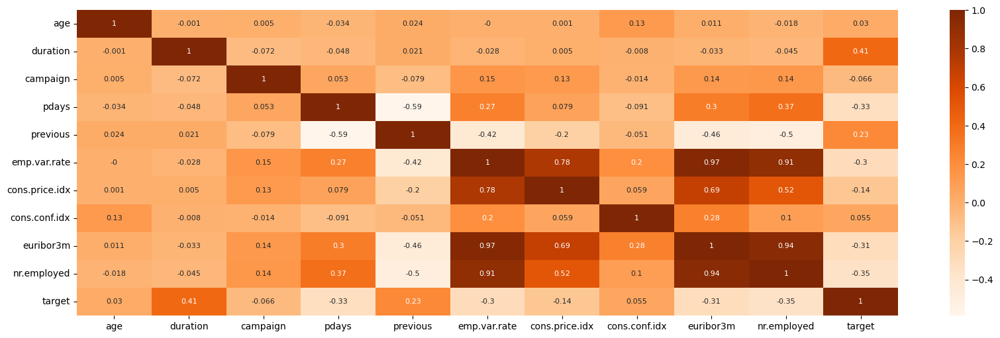

In [25]:
import seaborn as sns
df_cor= df.corr(numeric_only= True).round(3)
plt.figure(figsize=(20, 6))
sns.heatmap(df_cor, cmap= "Oranges" , annot=True, annot_kws={"fontsize":8})

* We notice that duration, previous, pday and nr, emplyed has the highest correlation to our target variable. 
* We also find thtat emp.var.rate ,nr.employed and euribor3 
*  nr.employed and euribor3 and , euribor3 and and emp.var.rate have very high correlation.

## Multicollinarity check

### Variable Inflation Filter

In [26]:
from statsmodels.stats.outliers_influence import variance_inflation_factor    
def compute_vif(considered_features):       
    try: 
        # fill na values
        X = df[considered_features].copy().fillna(0)
        # the calculation of variance inflation requires a constant, add intercept column with 1 as constant
        X['intercept'] = 1    
        # create empty dataframe to store vif values
        vif = pd.DataFrame()
        vif["Variable"] = X.columns
        #The enumerate() function is used to loop over the feature names and their corresponding index positions.
        vif["VIF"] = [variance_inflation_factor(X.values, i) for i, j in enumerate(X.columns) ]
        vif = vif[vif['Variable']!='intercept']
        return vif
    except Exception as e:
        print(e)
multicor= compute_vif(num_cols)

### Results of VIF suggest the same out come to we will remove , 'euribor3m',"emp.var.rate

In [27]:
multicor#.query('VIF >31 ')

,Variable,VIF
0,age,1.018794
1,duration,1.009459
2,campaign,1.038442
3,pdays,1.614864
4,previous,1.796720
5,emp.var.rate,33.066002
6,cons.price.idx,6.337163
7,cons.conf.idx,2.649399
8,euribor3m,64.342128
9,nr.employed,31.670063


In [28]:
df= df.assign(
    eur_emp= df["euribor3m"] * df["emp.var.rate"],
    #eur_nr= df["euribor3m"] * df["nr.employed"]
    ).drop(columns=['euribor3m',"emp.var.rate", "age"])

In [29]:
multicor= compute_vif(df.select_dtypes([float, int]).columns    )
multicor

,Variable,VIF
0,duration,1.009440
1,campaign,1.039632
2,pdays,1.618823
3,previous,1.793886
4,cons.price.idx,3.570702
5,cons.conf.idx,1.703340
6,nr.employed,6.114517
7,eur_emp,11.846293


<AxesSubplot: >

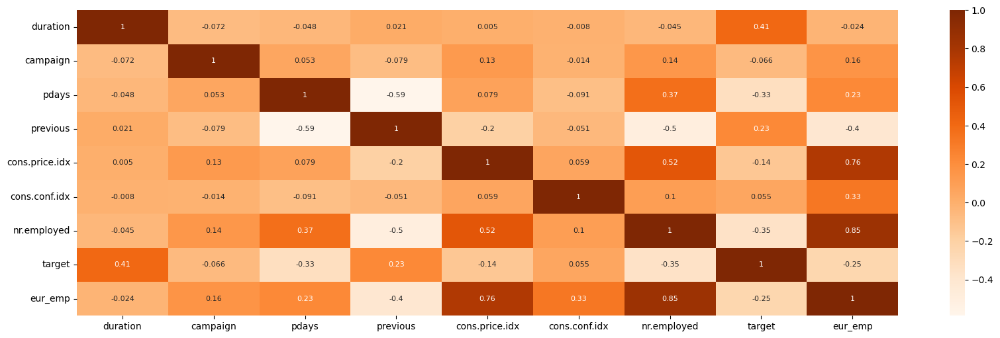

In [30]:
import seaborn as sns
df_cor= df.corr(numeric_only= True).round(3)
plt.figure(figsize=(20, 6))
sns.heatmap(df_cor, cmap= "Oranges" , annot=True, annot_kws={"fontsize":8})

In [31]:
def plot_box(var):
    p=(
        df
        .plot.box(x="target",y=var, width= 800, height=400)       
        .update_layout(
            #bargap=0.1,
            title = "<b> Title: Boxplot of {} </b>".format(var),
            xaxis_title = var,                       
            font_family="Courier New",
            font_color="black",
            font_size = 12,
            title_font_family="Times New Roman",
            title_font_color="black",        
            legend_title_font_color= "grey"
            )        
    )
    return p.show()

list(
    map(
        plot_box,df.select_dtypes([float,int]).columns
        )
   )

[None, None, None, None, None, None, None, None]

* From the Box plots above we can say that longer duration, marginally higher age and higher number of contacts leads to more subscripotions
* we can see that previous and pdays columns has extreme values .this might be a column that can use some outlier removal.

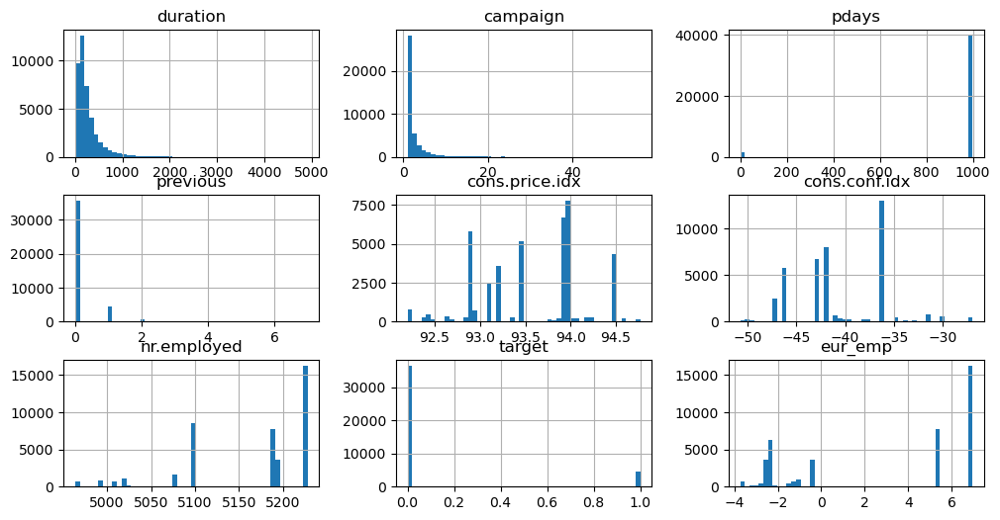

In [32]:
pd.options.plotting.backend = "matplotlib"
df.hist(bins=50, figsize=(12,6))
pd.options.plotting.backend = "plotly"

In [33]:
# df[df.select_dtypes(["bool","object", "category"]).columns] = df.select_dtypes(["bool","object", "category"]).apply(lambda df_: pd.factorize(df_)[0])
# df

Now We are set for preprocessing modelling

# Train/Test Split

We will split the data in train and test for the preprocessing and training the model.
We will use the stritification we that the ratio of classes stays the same between train and test set.

In [34]:
target_variable= "target"
df_x = df.drop(columns=target_variable)
df_y = df[target_variable]#.astype("category")
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    df_x, df_y, test_size = 0.2, stratify=df_y, random_state =42
    )
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((32940, 11), (32940,), (8236, 11), (8236,))

# Preprocess Data

In [35]:
# preprocess
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline 
from sklearn.compose import ColumnTransformer
# transformer/imputer/scaller/var filter
from sklearn.preprocessing import OneHotEncoder,StandardScaler ,PolynomialFeatures
from sklearn.feature_selection import VarianceThreshold, SelectFromModel

# Library Models/Metrics pipelines

In [36]:
# Import Models
from sklearn import linear_model ,tree , ensemble, neighbors
# metric evaluation and cross validation
from sklearn import metrics
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

# Libraries GRID and sample split

In [37]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

In [38]:
from imblearn.pipeline import Pipeline 
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE 
up_smpl = RandomOverSampler(random_state = 42) 
#up_smpl = RandomUnderSampler(random_state = 42)
#up_smpl = SMOTE(random_state = 42) 

># Preprocessor

In [39]:
# seperate columns
all_cols = X_train.columns.tolist()                      
cat_cols = X_train.select_dtypes(["object","category"]).columns.tolist()                      
num_cols= X_train.columns[~X_train.columns.isin(cat_cols)] 
num_cols

Index(['duration', 'campaign', 'pdays', 'previous', 'cons.price.idx',
       'cons.conf.idx', 'nr.employed', 'eur_emp'],
      dtype='object')

In [40]:
cat_cols

['contact', 'month', 'poutcome']

In [41]:
df.contact.unique()

array(['telephone', 'cellular'], dtype=object)

In [42]:

num_pipe= Pipeline (
        steps =[
        ("std_scaler", StandardScaler()),        
        ("variance_filter", VarianceThreshold(threshold= 0.1))
                ]
                    )
cat_pipe= Pipeline (
        steps =[        
        ("one_hot", OneHotEncoder(sparse_output=False, drop= "first", handle_unknown= "ignore"))        
                ]
                    )

prep = ColumnTransformer(
    transformers= [      
        ("n", num_pipe, num_cols), 
        ("c", cat_pipe, cat_cols),                      
        ],
        #remainder="passthrough",        
n_jobs=-1,
).set_output(transform="pandas")

prep.fit_transform(X_train,y_train)


,n__duration,n__campaign,n__pdays,n__previous,n__cons.price.idx,n__cons.conf.idx,n__nr.employed,n__eur_emp,c__contact_telephone,c__month_aug,c__month_dec,c__month_jul,c__month_jun,c__month_mar,c__month_may,c__month_nov,c__month_oct,c__month_sep,c__poutcome_nonexistent,c__poutcome_success
36454,-0.527170,-0.202879,0.195027,1.657135,-1.057203,-0.062687,-1.252900,-1.575674,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1233,3.344770,-0.563899,0.195027,-0.348598,0.722038,0.887842,0.332805,0.572419,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
24111,-0.348525,-0.563899,0.195027,-0.348598,-0.648202,-0.321922,0.399107,-0.803508,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
15516,-0.499985,0.519161,0.195027,-0.348598,0.590881,-0.473142,0.845259,0.954122,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
17916,-0.235901,0.519161,0.195027,-0.348598,0.590881,-0.473142,0.845259,0.955459,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33267,-0.833974,-0.563899,0.195027,-0.348598,-1.178005,-1.229245,-0.936588,-1.256812,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
22714,2.389407,0.880181,0.195027,-0.348598,-0.227121,0.952651,0.845259,0.956461,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6971,1.402975,-0.563899,0.195027,-0.348598,0.722038,0.887842,0.332805,0.573731,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
18503,-0.764069,-0.563899,0.195027,-0.348598,0.590881,-0.473142,0.845259,0.957798,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# Create function for valuation scores

In [43]:
from sklearn.metrics import confusion_matrix, classification_report, classification_report
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_auc_score
def cl_scores(true, predicted):  
    results= pd.DataFrame.from_dict(classification_report(y_test, predicted, output_dict=True))    
    return results
def eval_scores(actuals, pred):
    res= pd.DataFrame({ 
    "accuracy": [accuracy_score(actuals, pred)], 
    "recall": [recall_score(actuals, pred)],
    "roc_auc": [roc_auc_score(actuals, pred)],
    "precision": [precision_score(actuals, pred)]})
    return res

In [44]:
from sklearn.utils.class_weight import compute_class_weight
sample_weight = compute_class_weight(
             class_weight='balanced', classes=  np.unique(y_train) ,y= y_train
             ) 
print(sample_weight)

[0.56348147 4.43815683]


# Prepare Models

# Create complete preprocess + model pipes

In [45]:
MLA= {                      
    "lm": linear_model.LogisticRegression(penalty="l2", C= .001 ,solver='lbfgs', fit_intercept=True,class_weight= "balanced", max_iter=1000, random_state=1),                 
    "dt" : tree.DecisionTreeClassifier(class_weight= "balanced",random_state=1),    
    } 
pipes = {}
for x in MLA.keys():    
        pipe= Pipeline(steps=[
                ('sampling', up_smpl),  
                ("preprocess", prep),
                #('poly', PolynomialFeatures(degree= 1,  interaction_only= True,  include_bias=False)),                
                #('sampling', up_smpl),  
                #('feature_selection',SelectFromModel(linear_model.LogisticRegression(penalty="l1", C= 0.1 ,solver='saga',fit_intercept=True,class_weight="balanced",random_state=1,max_iter= 10000 ))),                
                ("model", MLA[x])]
                ).set_output(transform="pandas")
        pipes[x]=  pipe
pipes.keys()
pipes["lm"][:-1].fit_transform(X_train,y_train)

,n__duration,n__campaign,n__pdays,n__previous,n__cons.price.idx,n__cons.conf.idx,n__nr.employed,n__eur_emp,c__contact_telephone,c__month_aug,c__month_dec,c__month_jul,c__month_jun,c__month_mar,c__month_may,c__month_nov,c__month_oct,c__month_sep,c__poutcome_nonexistent,c__poutcome_success
0,-0.737055,-0.139873,0.359332,0.988892,-0.810692,-0.116046,-0.683777,-1.246780,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.072280,-0.565101,0.359332,-0.451176,0.812428,0.703737,0.635171,0.861192,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,-0.607437,-0.565101,0.359332,-0.451176,-0.437579,-0.339623,0.690319,-0.489036,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,-0.717331,0.710583,0.359332,-0.451176,0.692780,-0.470043,1.061417,1.235767,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,-0.525721,0.710583,0.359332,-0.451176,0.692780,-0.470043,1.061417,1.237078,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58453,0.257624,1.561039,0.359332,0.988892,-0.634368,-1.289827,-0.420677,-1.007650,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
58454,-0.359472,-0.139873,0.359332,-0.451176,-1.204271,1.337207,-1.289252,-0.887078,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
58455,0.029383,-0.565101,0.359332,-0.451176,-1.730092,1.933413,-1.358187,-1.011538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
58456,0.584487,-0.565101,0.359332,0.988892,-0.437579,-0.339623,0.690319,-0.483790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# Run all models once

In [46]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
scores= []
auc_scores =[]
for model in MLA.keys():    
    pipes[model].fit(X_train, y_train )         
    scores.append( eval_scores(y_test, pipes[model].predict(X_test) ).assign(model = model))  
pd.concat(scores).sort_values("accuracy", ascending=False)

,accuracy,recall,roc_auc,precision,model
0,0.889145,0.522629,0.729158,0.507853,dt
0,0.855998,0.892241,0.871819,0.432602,lm


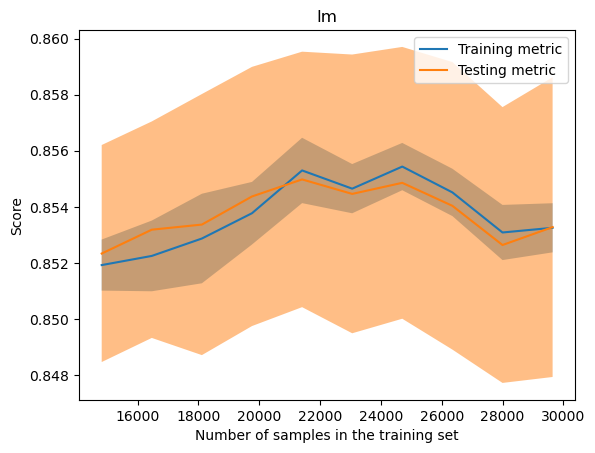

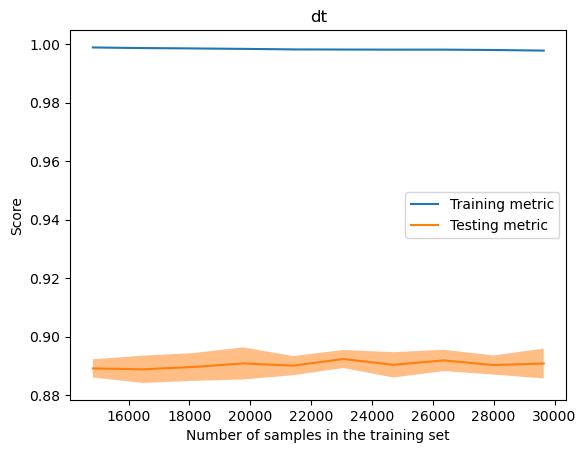

In [47]:
from sklearn.model_selection import LearningCurveDisplay

for x in MLA.keys():
    fig= LearningCurveDisplay.from_estimator(
    pipes[x], X_train, y_train, cv=10, n_jobs=-1, score_type= "both", train_sizes= np.linspace(0.5, 1, 10 )
    )   
    plt.title(x)

The test score for rf is .78 compared to .99 train score. The randomforest, decision and lgb are overfitting quite a bit as can be seen from the plots below.

## OverFitting 
Overfitting occurs when a machine learning model is too complex and begins to memorize the training data rather than learning to generalize patterns in the data. As a result, the model performs well on the training data, but poorly on new, unseen data.


Lets Tune our model to improve the accuracy and reduce the overfitting so models can genral on unseen data better.

# Hyper Parameters
Lets define out hyperparameters

In [48]:
from scipy.stats import randint, uniform, norm,reciprocal, expon, loguniform
from scipy.stats.distributions import randint, uniform
reciprocal.rvs(20, 200000), expon.rvs(scale=1.0)
# loc is lower bound value and scale is the +2 range and size is number of observations 
uniform.rvs(loc=5, scale=2, size= 10),randint.rvs(low=20, high=70, size=10),norm.rvs(0.1, 1)
# use randint.rvs(1,4) and uniform.rvs to see output values
grid_poly = randint(1,2)
grid_solvers= ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
grid_C=  uniform(0.001, .01)
grid_penalties= ['l2']

max_features = [.5,.6,.7,.8,.9]
grid_max_depth = randint(2,7) 
grid_sample_split= randint(20,100)
grid_min_sample_leaves = randint(5, 60)
grid_neighbours = randint(3, 7)

In [49]:
MLA_params = {          
    "lm": [{        
       # "poly__degree": grid_poly,
        #"feature_selection__estimator__C": grid_C,
        "model__C": grid_C,
        'model__penalty' : grid_penalties,         
        #'model__solver' :grid_solvers,         
        'model__max_iter': [1000]
        }],  
    
    "dt": [{   
        #"poly__degree": grid_poly,
        #"feature_selection__estimator__C": grid_C,     
        'model__max_depth': grid_max_depth, 
        'model__max_features': max_features,   
        'model__min_samples_leaf': grid_min_sample_leaves,                    
            }]
    
    } 

# CV split

In [50]:
cv_split = StratifiedKFold(n_splits= 10, random_state=10 , shuffle=True)

# Run Random CV for all models

In [51]:
import warnings
warnings.filterwarnings('ignore')

tune_params = {}
best_model_scores= {}
best_models = {}
cl_report=[]
scores =[]
for x in MLA.keys():
    grid_cv= RandomizedSearchCV(
            pipes[x],
            param_distributions = MLA_params[x],
            cv= cv_split,
            scoring="f1",
            n_iter = 50,
            refit = "precision",
            random_state=1,
            verbose= 0,
            n_jobs= -1 )

    tune_grid =grid_cv.fit(X_train, y_train)
    tune_params[x]= pd.DataFrame.from_dict(tune_grid.cv_results_ ).assign(model= x)
    best_model_scores[x] = [tune_grid.best_score_]
    best_models[x] = tune_grid.best_estimator_    
    best_models[x].fit(X_train, y_train)       
    cl_report.append(cl_scores(y_test,best_models[x].predict(X_test)).assign(model=x))     
    scores.append(eval_scores(y_test,best_models[x].predict(X_test)).assign(model=x))
    

## Evaluation Scores
The Model with best ROC/AUC over 10kfold cv has .8495 score on training data

In [52]:
pd.DataFrame.from_dict(best_model_scores)

,lm,dt
0,0.577232,0.573057


In [53]:
pd.concat(scores)

,accuracy,recall,roc_auc,precision,model
0,0.857455,0.895474,0.874051,0.435535,lm
0,0.841671,0.914871,0.873623,0.409354,dt


The best performing model is lgb with best roc_auc score of .81.

# Cross validation on best models

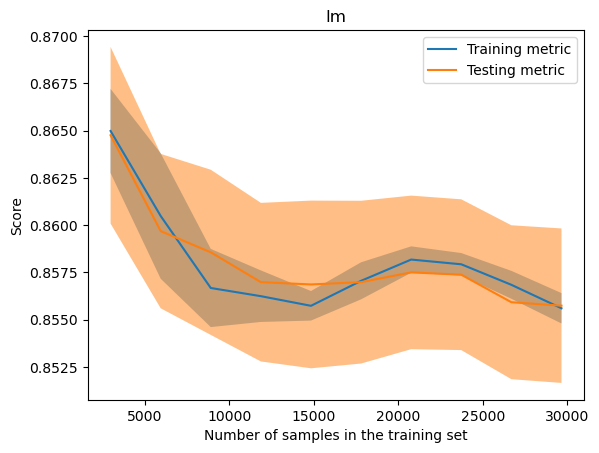

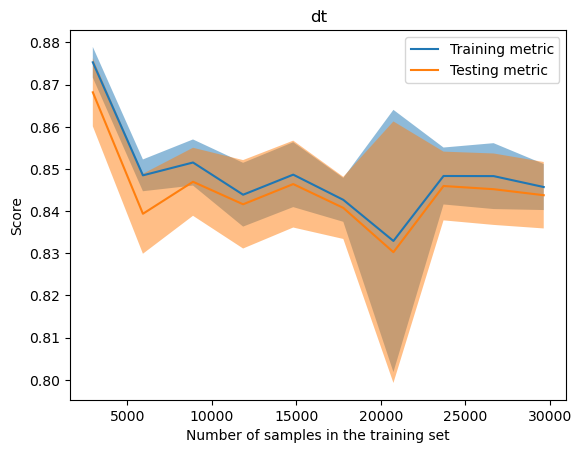

In [54]:
from sklearn.model_selection import LearningCurveDisplay

for x in MLA.keys():            
    fig= LearningCurveDisplay.from_estimator(
    best_models[x], X_train, y_train, cv=10, n_jobs=-1, score_type= "both", train_sizes= np.linspace(0.1, 1, 10 )
    )   
    plt.title(x)

After hyperparamter tuning we see that dt performing well. 

# Best Model

In [55]:
test_model_variable= "dt"

In [56]:
best_model_scores[test_model_variable]
final_pipe= best_models[test_model_variable]
final_pipe = final_pipe.fit(X_train, y_train)
final_pipe

Pipeline(steps=[('sampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('n',
                                                  Pipeline(steps=[('std_scaler',
                                                                   StandardScaler()),
                                                                  ('variance_filter',
                                                                   VarianceThreshold(threshold=0.1))]),
                                                  Index(['duration', 'campaign', 'pdays', 'previous', 'cons.price.idx',
       'cons.conf.idx', 'nr.employed', 'eur_emp'],
      dtype='object')),
                                                 ('c',
                                                  Pipeline(steps=[('one_hot',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['contact', 'month',
                                                   'poutcome'])])),
                ('model',
                 DecisionTreeClassifier(class_weight='balanced', max_depth=5,
                                        max_features=0.8, min_samples_leaf=12,
                                        random_state=1))])

In [57]:
eval_scores(y_test, final_pipe.predict(X_test))

,accuracy,recall,roc_auc,precision
0,0.841671,0.914871,0.873623,0.409354


## In little time we managed to make a decent model however the precision of the model is not good however. .73, .79 and .39 recall, roc_auc and precision respectively

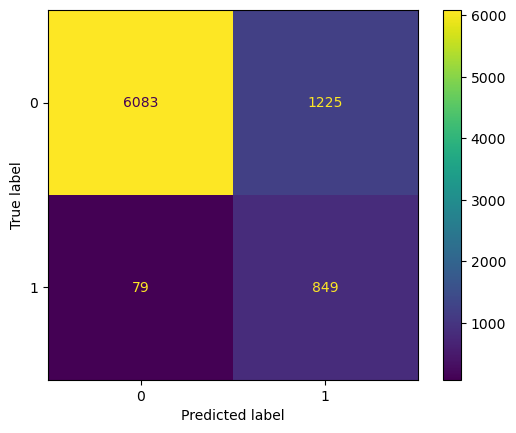

In [58]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test,final_pipe.predict(X_test), labels=y_train.unique())
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=y_train.unique())
disp.plot()
plt.show()

# Decision Tree Model to find the rules and interactions 

In [59]:
feat_importances = pd.Series( final_pipe["model"].feature_importances_  , 
                             index= final_pipe[:-1].get_feature_names_out() ).reset_index()
feat_importances.columns = ["variable", "value"]
feat_importances
feat_importances.sort_values("value", ascending=False).head(10).plot.bar(x= "value", y="variable", color= "variable", title= "important variables Decision Tree")

*  The chart above shows the most important variables according to information gain.
*  The the top three most important variables duration of calls, number or employees indicator, intersection of euriborrate and emplyment rate and outcome of previous campaign.

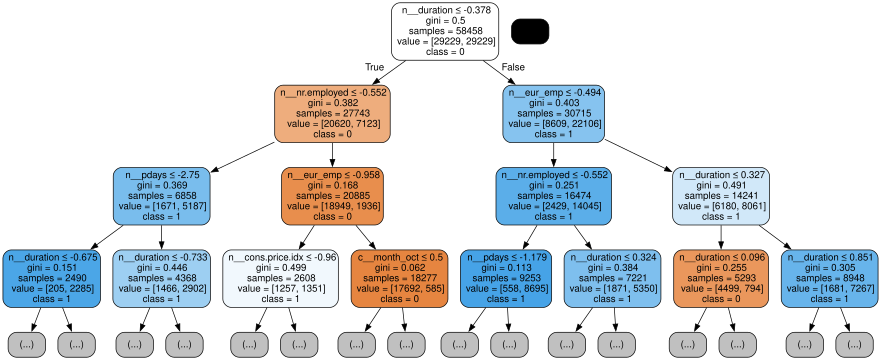

In [60]:
def tree_plot(pipe):
    from sklearn.tree import  plot_tree, export_graphviz
    import graphviz, pydotplus
    dot_data = export_graphviz(
    pipe["model"],
    feature_names= pipe[:-1].get_feature_names_out(),
    class_names= pipe["model"].classes_.astype('str'),
    filled=True, rounded=True, special_characters=True,max_depth= 3 
    )        
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)    
    pydot_graph.set_size('"22,5"')    
    gvz_graph = graphviz.Source(pydot_graph.to_string())
    return gvz_graph

tree_plot(final_pipe)

* thre chart above shows the decision tree process and rules to determine the outcome

# Best Model

In [61]:
test_model_variable= "lm"

In [62]:
best_model_scores[test_model_variable]
final_pipe= best_models[test_model_variable]
final_pipe = final_pipe.fit(X_train, y_train)
final_pipe

Pipeline(steps=[('sampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('n',
                                                  Pipeline(steps=[('std_scaler',
                                                                   StandardScaler()),
                                                                  ('variance_filter',
                                                                   VarianceThreshold(threshold=0.1))]),
                                                  Index(['duration', 'campaign', 'pdays', 'previous', 'cons.price.idx',
       'cons.conf.idx', 'nr.employed', 'eur_emp'],
      dtype='object')),
                                                 ('c',
                                                  Pipeline(steps=[('one_hot',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['contact', 'month',
                                                   'poutcome'])])),
                ('model',
                 LogisticRegression(C=0.010682615757193977,
                                    class_weight='balanced', max_iter=1000,
                                    random_state=1))])

In [63]:
eval_scores(y_test, final_pipe.predict(X_test))

,accuracy,recall,roc_auc,precision
0,0.857455,0.895474,0.874051,0.435535


## In little time we managed to make a decent model however the precision of the model is not good however. .73, .79 and .39 recall, roc_auc and precision respectively

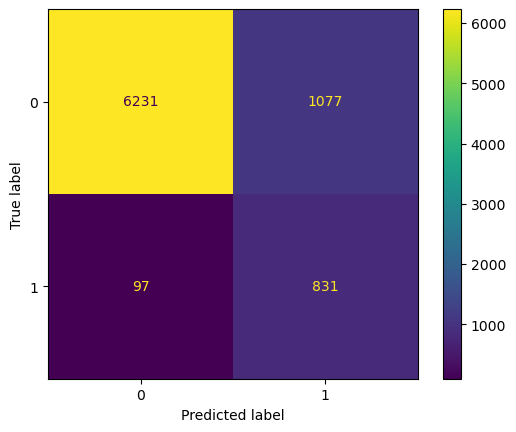

In [64]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test,final_pipe.predict(X_test), labels=final_pipe["model"].classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=final_pipe["model"].classes_)
disp.plot()
plt.show()

In [65]:
import sys
sys.path.append('/Users/waleedidrees/Dropbox/Python_Projects/My_Projects/Templates_ML_')
from custom_models_tranformers import logit_pvalue
results= logit_pvalue(final_pipe, X_train,y_train).sort_values("p>z").round(3)
results

21
(21, 5)


,vars,coefs,std_error,z,p>z
1,n__duration,2.309,0.033,69.216,0.000
15,c__month_may,-1.163,0.065,-17.861,0.000
7,n__nr.employed,-0.742,0.082,-9.081,0.000
8,n__eur_emp,-0.931,0.115,-8.103,0.000
14,c__month_mar,1.093,0.141,7.737,0.000
6,n__cons.conf.idx,0.262,0.038,6.864,0.000
16,c__month_nov,-0.615,0.095,-6.473,0.000
3,n__pdays,-0.561,0.112,-4.999,0.000
2,n__campaign,-0.088,0.021,-4.228,0.000
12,c__month_jul,0.328,0.093,3.537,0.000


* The coefficient represents the estimated change in the log odds of the dependent variable due to a one-unit standard deviation (because data is standardised) increase in independent variable, holding all other variables constant.

* The standard error represents the uncertainty of the estimated coefficient, and the t-value is the coefficient divided by its standard error.

* the coefficients here are log(p/1-p) or log(odds).

* A positive values > 0 signifies increase in the log(odds) of the event when we have a positive change in the coefficient.

* A negative values <0 signifies decrease in the probability of the event when we have a positive change in the coefficient.

* the graph below shows the mist significant variables that help making the predictions

* the top 3 most significant variables are the duration of the call, number of days since the client was last conacted and if the month of may.

In [66]:
(
results
.assign(z = lambda df_ : abs(df_.z) )    
.sort_values("z", ascending=False)
.query('vars != "const"')
.head(10)
.plot.bar(x="z" ,y="vars", color= "vars" ,title = 'Variables on the basis of t values significance')
)

* we can take exp of log (odds) to get the odds by factor or as percentage increase of decrese.

* The coefficient represents the estimated change in the log odds of the dependent variable due to a one-unit standard deviation (because data is standardised) increase in independent variable, holding all other variables constant.

* The standard error represents the uncertainty of the estimated coefficient, and the t-value is the coefficient divided by its standard error.

* the coefficients here are log(p/1-p) or log(odds).

* A positive values > 0 signifies increase in the log(odds) of the event when we have a positive change in the coefficient.

* A negative values <0 signifies decrease in the probability of the event when we have a positive change in the coefficient.

* we can take exp of log (odds) to get the odds by factor or as percentage increase of decrese.

### taking exponent of log(odds) of coefficiens

In [67]:
( results
 [results["p>z"] <= 0.01]
 .assign(coefs= np.exp(results.coefs))
 .sort_values("coefs", ascending=False)
 )

,vars,coefs,std_error,z,p>z
1,n__duration,10.064355,0.033,69.216,0.000
14,c__month_mar,2.983210,0.141,7.737,0.000
17,c__month_oct,1.475505,0.146,2.659,0.008
19,c__poutcome_nonexistent,1.407760,0.104,3.286,0.001
12,c__month_jul,1.388189,0.093,3.537,0.000
6,n__cons.conf.idx,1.299527,0.038,6.864,0.000
2,n__campaign,0.915761,0.021,-4.228,0.000
9,c__contact_telephone,0.836942,0.063,-2.816,0.005
3,n__pdays,0.570638,0.112,-4.999,0.000
16,c__month_nov,0.540641,0.095,-6.473,0.000


## Results interpretations

* the largest positive coefficient is call duration, cons month of march, and previous outcome. 

* coefficients on duration index suggest that one standard deviation increase in duration of call is associated with an increase in odds of buying subsription by a factor of 10.06 .

* coefficients on month of march suggests that if the client was contacted in march, the odds of client buying subsription are more by a factor 2.98 compared to base month and keeping all other variables constant.

* coefficients where customer belongs to the category that he is not previously contacted, the odds of client buying subsription are more by a factor 1.40 compared to base outcome category and keeping all other variables constant.

* On the other hand the variables that have the most negative effects are month of may.

* coefficients on month of may suggests that if the client was contacted in may , the odds of client buying subsription are less by a factor of (1-.31) or almost 69% less compared to base month and keeping all other variables constant.

* coefficients on contact by telphone suggests that if the client was contacted via telephone instead of cellular , the odds of client buying subsription are less by a factor of (1-.83) or almost 17% less compared to contacting via celluler.


## Graph below shows the most positive and negative coeffcients 

In [68]:
(
 results[results["p>z"] <= 0.01].sort_values("coefs", ascending=False)
.assign(z = lambda df_ : abs(df_.z) )    
.sort_values("coefs", ascending=False)
.query('vars != "const"')
.plot.bar(x="coefs" ,y="vars", color= "vars" ,title = 'Variables on the basis of highest positive effect')
)

# Conlcusion and Further modelling

* We analysed the bank campagn data and highlighted the most important variables in predicting the subscription to the product line using two models. 

* The decision tree  and ridge regression shows that duration of calls is the most crucial factor in predicting subscription, followed by the number of employees indicator and the outcome of the previous campaign. 

* Ridge Regression shows variable coefs in detail and we find contacting clients is certain months is associated to higher subcription bought.

* These findings can guide the bank in optimizing its marketing campaign by targeting customers based on these variables. 

* However, the analysis also suggests that further work is needed to improve the model's precision scores.

In [69]:
# import sys
# sys.path.append('/Users/waleedidrees/Dropbox/Python_Projects/My_Projects/Templates_ML_')
from custom_models_tranformers import classification_curves
plot_curves= classification_curves(final_pipe, X_test, y_test)


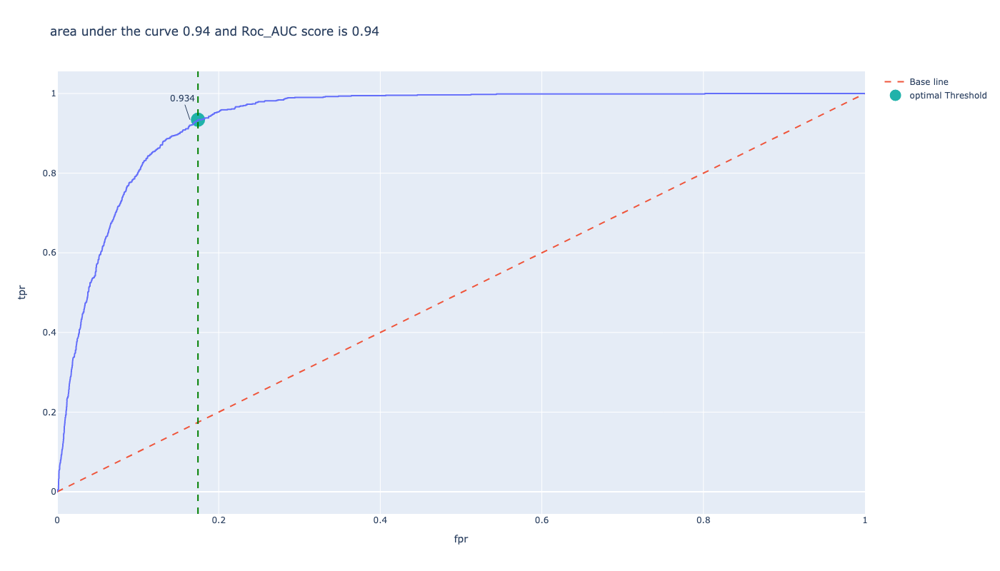

In [70]:
plot_curves.RocAucCuve()    

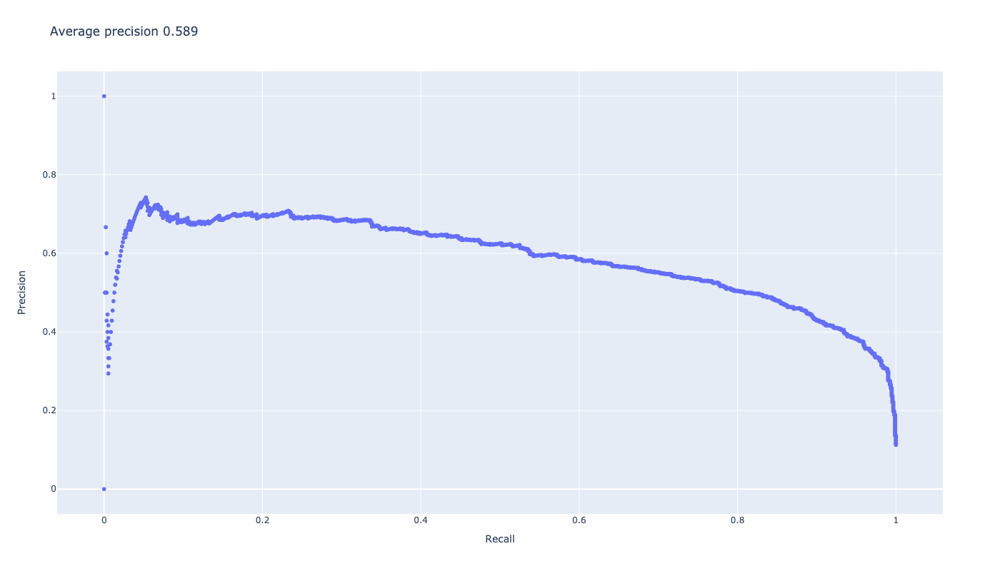

(<custom_models_tranformers.classification_curves at 0x168971b40>, None)

In [71]:
plot_curves.PrecisionRecallCurve()

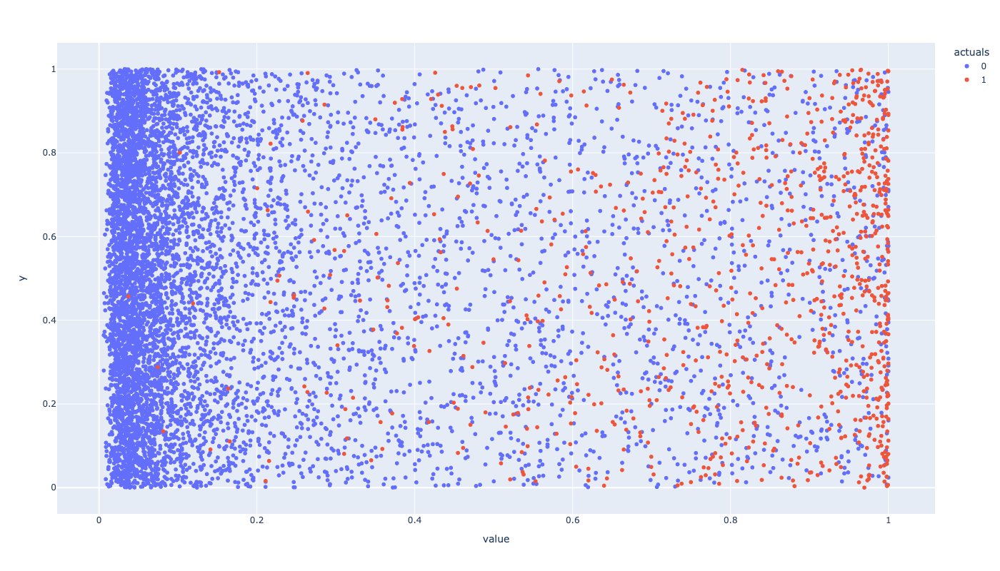

In [72]:
plot_curves.PredictionAccuracyCurve()

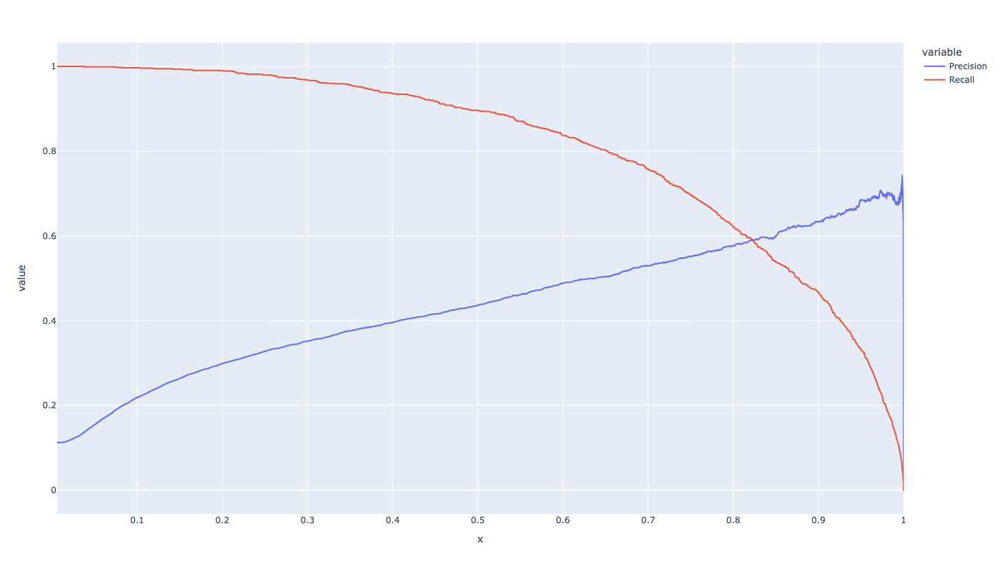

In [73]:
plot_curves.PrecisionRecallCurveThresh()